In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os 
import glob

In [9]:
input_dir = 'dataset/test'
input_dir_add = 'add_dataset/test'
filter_img_dir = 'pictures_result/filter_img/'
hsv_img_dir = 'pictures_result/hsv_img/'
green_mask_dir = 'pictures_result/green_mask/'
yellow_mask_dir = 'pictures_result/yellow_mask/'
red_mask_dir = 'pictures_result/red_mask/'
full_mask_dir = 'pictures_result/full_mask/'
outImg_dir = 'pictures_result/outImg/'

In [12]:
def segmentImage(img, file):
    original_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    filter_img = cv2.medianBlur(original_img,9)
    hsv_img = cv2.cvtColor(filter_img, cv2.COLOR_RGB2HSV)
    
    green_low = np.array([45, 40, 40])
    green_high = np.array([75,255,255])
    green_mask = cv2.inRange(hsv_img, green_low, green_high) 
    
    yellow_low = np.array([15, 40, 40])
    yellow_high = np.array([45,255,255])
    yellow_mask = cv2.inRange(hsv_img, yellow_low, yellow_high)
    
    red_low = np.array([1, 40, 40])
    red_high = np.array([15,255,255])
    red_mask1 = cv2.inRange(hsv_img, red_low, red_high)
    red_low2 = np.array([173, 40, 40])
    red_high2 = np.array([179,255,255])
    red_mask2 = cv2.inRange(hsv_img, red_low2, red_high2)
    red_mask = red_mask1 + red_mask2
    
    outImg = green_mask + yellow_mask + red_mask
    
    full_mask = cv2.bitwise_and(img, img, mask=outImg)
   
    #to display results
    plt.figure(figsize=(15,5))
    plt.subplot(1,8,1), plt.imshow(original_img), plt.title("1. Original RGB")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,2), plt.imshow(filter_img), plt.title("2. Filter Image")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,3), plt.imshow(hsv_img), plt.title("3. HSV Image")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,4), plt.imshow(green_mask, cmap='gray'), plt.title("4. Green Mask")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,5), plt.imshow(yellow_mask, cmap='gray'), plt.title("5. Yellow Mask")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,6), plt.imshow(red_mask, cmap='gray'), plt.title("6. Red Mask")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,7), plt.imshow(full_mask), plt.title("7. Color Mask")
    plt.xticks([]), plt.yticks([])
    plt.subplot(1,8,8), plt.imshow(outImg, cmap='gray'), plt.title("8. Output")
    plt.xticks([]), plt.yticks([])
    plt.imshow
      

    #save each images
    file_split = file.split('\\')
    file_split1 = file_split[1].split('.')
    filename1 = filter_img_dir + file_split1[0] + '.png'
    filename2 = hsv_img_dir + file_split1[0] + '.png'
    filename3 = green_mask_dir + file_split1[0] + '.png'
    filename4 = yellow_mask_dir + file_split1[0] + '.png'
    filename5 = red_mask_dir + file_split1[0] + '.png'
    filename6 = full_mask_dir + file_split1[0] + '.png'
    filename7 = outImg_dir + file_split1[0] + '.png'
    
    cv2.imwrite(filename1, filter_img)
    cv2.imwrite(filename2, hsv_img)
    cv2.imwrite(filename3, green_mask)
    cv2.imwrite(filename4, yellow_mask)
    cv2.imwrite(filename5, red_mask)
    cv2.imwrite(filename6, full_mask)
    cv2.imwrite(filename7, outImg)
    
    return outImg


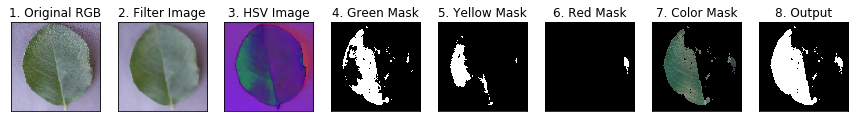

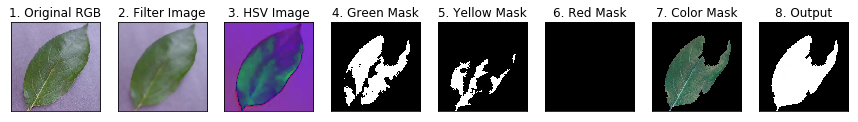

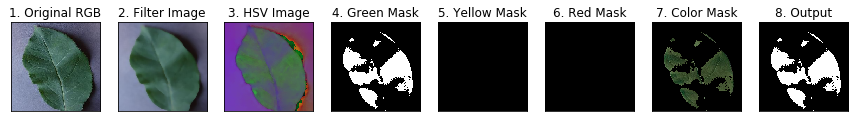

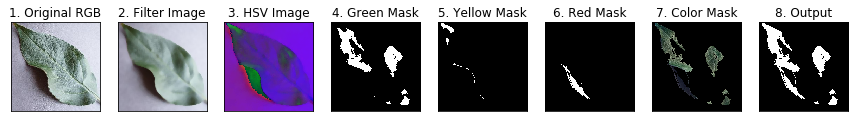

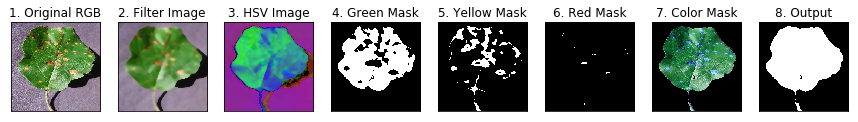

...

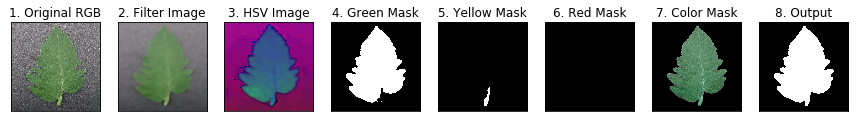

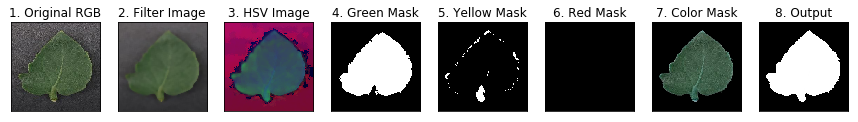

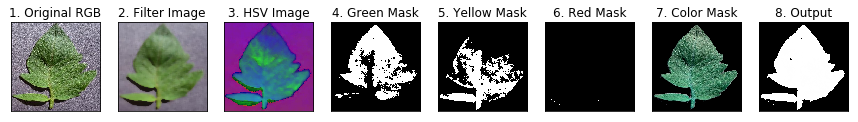

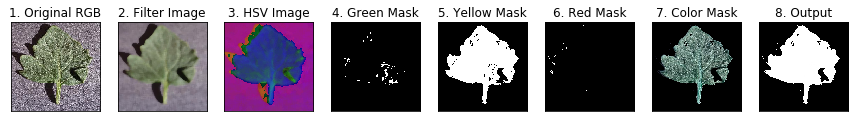

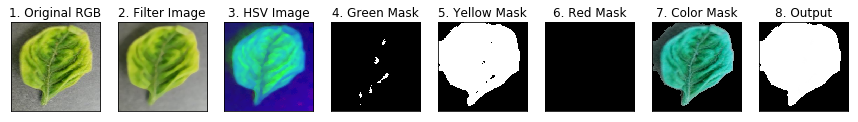

In [13]:
#to call all image files from first dataset 
data_path = os.path.join(input_dir, '*g') 
files = glob.glob(data_path)
data = [] 
for f1 in files: 
    image = cv2.imread(f1) 
    data.append(image)
    segmentImage(image, f1)
    

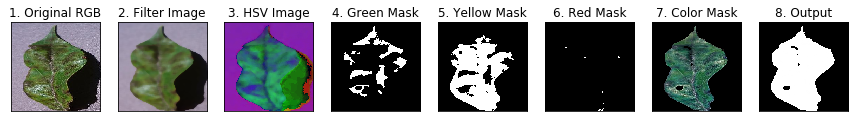

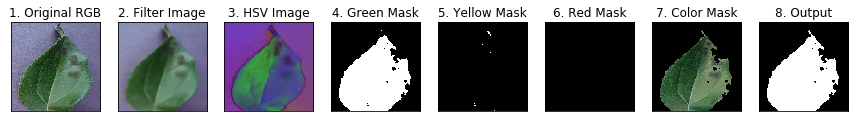

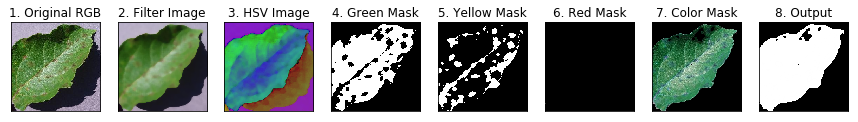

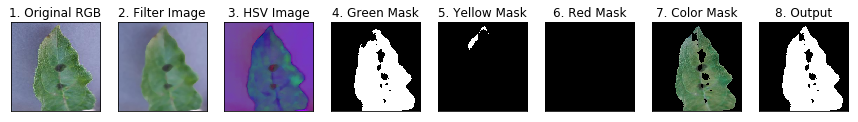

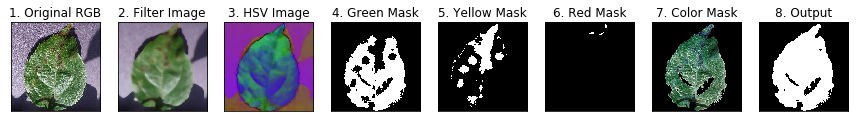

...

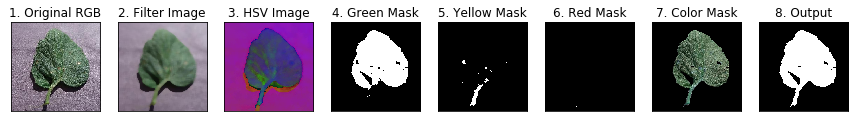

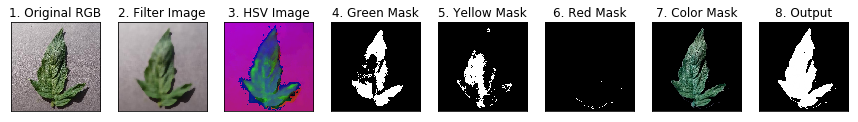

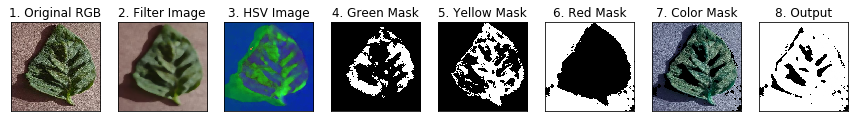

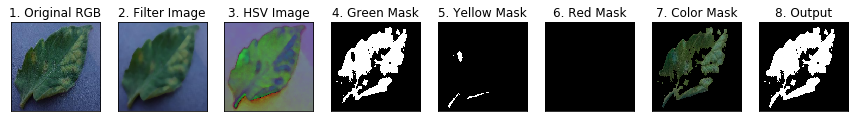

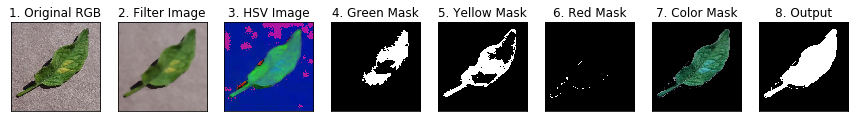

In [14]:
#to call all image files from second dataset 
data_path = os.path.join(input_dir_add, '*g') 
files = glob.glob(data_path)
data = [] 
for f1 in files: 
    image = cv2.imread(f1) 
    data.append(image)
    segmentImage(image, f1)